<h1>AirBnb Data Analysis - Cape Town, South Africa</h1>
<img src="cape-town.jpg" alt="Cape Town">

Cape Town also known as the African Europe, a world class destination for tourists and Coastal Fanatics alike . Want to plan a huge trip to Cape Town want to make a informed decision into what may drive the Price up or a home owner looking to renovate your home into a Bed and Breakfast and gain extra income but don't know how to price it in the market then this is for you .

We want to review what goes into making a Airbnb listing price and how much should one charge . 

### EDA (Exploratory Data Analysis )

Explore our dataset , try to see trends between the target variable ie Price in relation to the other given columns.

- What is the current price points of Cape Town
- What is the average amount one would spend in Cape Town 
- Depending on what type of room you have does it change the outcome of the price 
- What is the review landscape like 


### Map

- Can we see the variance of Airbnb locations 
- Are the locations closely grouped and can we see specific areas of high volume 
- What types of rooms are most predominant


### Reviews

-See the spread of the reviews on the Airbnbs

### Prediction 

- 

### Import Datasets and Required Packages

In [1]:
import mlflow
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import sklearn
import numpy as np

C:\Users\Nyiko\Anaconda3\lib\site-packages\jinja2\utils.py:485: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping


In [2]:
listings = pd.read_csv('listings.csv',low_memory=False)
reviews = pd.read_csv('reviews.csv',low_memory=False)

In [3]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24318 entries, 0 to 24317
Columns: 106 entries, id to reviews_per_month
dtypes: float64(24), int64(21), object(61)
memory usage: 19.7+ MB


In [4]:
# for i in listings.columns:
#     print(i)

In [5]:
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3191,https://www.airbnb.com/rooms/3191,20200426042542,2020-04-26,Malleson Garden Cottage,"This is a lovely, separate, self-catering cott...",Beautiful self catering luxury cottage in cent...,"This is a lovely, separate, self-catering cott...",none,"Mowbray is on the Southern Suburbs line, 6km (...",...,t,f,moderate,f,f,1,1,0,0,0.64
1,15007,https://www.airbnb.com/rooms/15007,20200426042542,2020-04-26,Blaauwberg House,Welcome to our self-catering beach-front famil...,The house sleeps 6 and has all necessary ameni...,Welcome to our self-catering beach-front famil...,none,"Bloubergstrand is a lovely, cosy suburb near C...",...,f,f,strict_14_with_grace_period,f,f,4,4,0,0,0.35
2,15068,https://www.airbnb.com/rooms/15068,20200426042542,2020-04-26,Grande Bay,Modern spacious apartment. Three bedrooms two...,Self catering. Lovely three bedroom apartment ...,Modern spacious apartment. Three bedrooms two...,none,Close to Eden on The Bay and lots of restauran...,...,f,f,strict_14_with_grace_period,f,f,10,10,0,0,NaN
3,15077,https://www.airbnb.com/rooms/15077,20200426042542,2020-04-26,Top relaxed beach living in style,Situated either on the ground floor with direc...,"A stunning architect designed guesthouse, Suns...",Situated either on the ground floor with direc...,none,It is probably the best hub in order to explor...,...,f,f,strict_14_with_grace_period,f,f,5,1,4,0,0.06
4,15180,https://www.airbnb.com/rooms/15180,20200426042542,2020-04-26,The Melkbaai - Beachfront,Comfortable and safe self catering flat for 2 ...,Self Catering Holiday Apartment available for ...,Comfortable and safe self catering flat for 2 ...,none,"Apartment is located in Beach Road, Strand, We...",...,f,f,strict_14_with_grace_period,f,f,1,1,0,0,NaN


We currently want all the numeric types like price, security_deposit,weekly_price which are currently strings due to the presence of the dollar sign and we want to convert them to floats to use later .

In [6]:
def clean_currency(x):
    """ If the value is a string, then remove currency symbol and delimiters
    otherwise, the value is numeric and can be converted
    """
    if isinstance(x, str):
        return(x.replace('$', '').replace(',', ''))
    return(x)

listings['price'] = listings['price'].apply(clean_currency).astype('float')
listings['security_deposit'] = listings['security_deposit'].apply(clean_currency).astype('float')
listings['weekly_price'] = listings['weekly_price'].apply(clean_currency).astype('float')
listings['monthly_price'] = listings['monthly_price'].apply(clean_currency).astype('float')
listings['cleaning_fee'] = listings['cleaning_fee'].apply(clean_currency).astype('float')


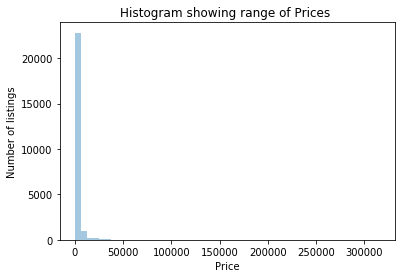

In [7]:
sns.distplot(listings.price,kde=False)
plt.title('Histogram showing range of Prices ')
plt.xlabel('Price')
plt.ylabel('Number of listings')
plt.show()

In [8]:
listings.price.describe()

count     24318.000000
mean       2493.194218
std        7502.148453
min           0.000000
25%         685.000000
50%        1104.000000
75%        2055.000000
max      315315.000000
Name: price, dtype: float64

We see a huge discrepancy in the price with the largest amount equalling 315315.00 now this major outlier may have significant changes towards the mean by raising it high and creating false realities . We then take the precaution to remove outliers which we calculate using the IQR and using 1.5 above or below to reduce the effect and remoce outliers. and view the new spread of the price

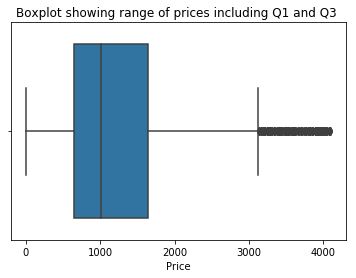

In [9]:
# Work out Interquartile range on price - using 1.5 IQR rule
Q1_price = listings['price'].quantile(0.25)
Q3_price = listings['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price
lowerRange = Q1_price - (1.5 * IQR_price)
upperRange = Q3_price + (1.5 * IQR_price)

# Removing rows where price deemed as outlier given IQR

listings_iqr = listings.copy()
listings_iqr.drop(listings_iqr[(listings_iqr.price > upperRange) | (listings_iqr.price < lowerRange)].index, inplace=True)
# Take another look at the price column
sns.boxplot(x = listings_iqr['price'])
plt.title('Boxplot showing range of prices including Q1 and Q3 ')
plt.xlabel('Price')
# plt.ylabel('Number of listings')
plt.show()

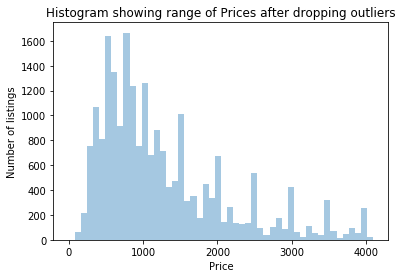

In [10]:
sns.distplot(listings_iqr['price'],kde=False)
plt.title('Histogram showing range of Prices after dropping outliers')
plt.xlabel('Price')
plt.ylabel('Number of listings')
plt.show()

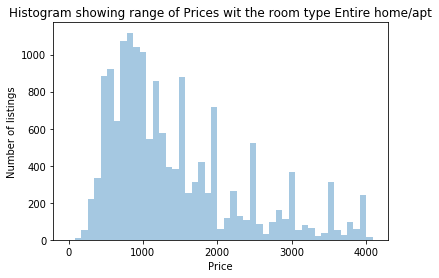

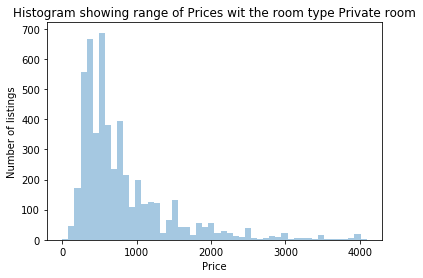

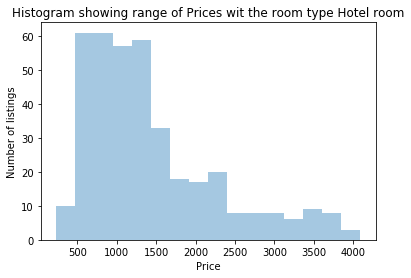

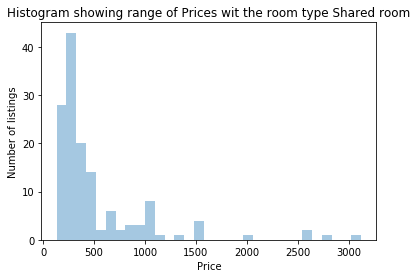

In [11]:
rooms =['Entire home/apt'  ,  
'Private room' ,       
'Hotel room' ,          
'Shared room' ]
for i in rooms:
    temp = listings_iqr[listings_iqr['room_type'] == i]
    sns.distplot(temp['price'],kde=False)
    plt.title(f'Histogram showing range of Prices wit the room type {i}')
    plt.xlabel('Price')
    plt.ylabel('Number of listings')
    plt.show()
    

What we observe here shows that regardless of the room type the same trend is presistent in the the price . The are all skewed to the left showing that we all as consumers prefer to travel or stay at a cheaper Airbnb . Now if you are the home owner this may have implications for you if you price too high less customers will come but if you price cheaper you will have more frequent customers.

In [12]:
listings_iqr.isnull().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
name                                               0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               5668
Length: 106, dtype: int64

In [13]:
listings_iqr.drop_duplicates(subset = 'id', keep = 'last', inplace = True)

We try to drop any duplicates so this does not sway our opinion

In [14]:
listings_iqr.room_type.value_counts()

Entire home/apt    15995
Private room        5133
Hotel room           386
Shared room          140
Name: room_type, dtype: int64

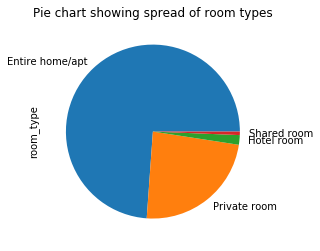

In [15]:
listings_iqr.room_type.value_counts().plot(kind='pie')
plt.title(f'Pie chart showing spread of room types')
plt.show()

Here we see that majority almost 75% of the data is Entire home/apt as room type which could be the most popular place to stay . This could be due to the recent rise in the AirBnb allowing home owners to open their homes to make profit and its convenience in comparison to a Hotel . Other human factor may come into play as a home away from home feels better than a lonely hotel . Shared room is the lowerst of the room types as most people hate sharing rooms as privacy is limited and feels restrictive.

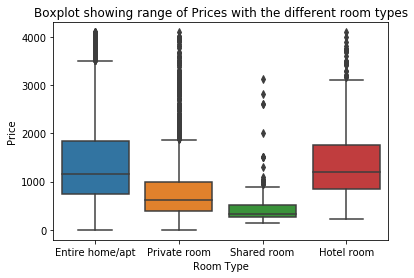

In [16]:
sns.boxplot(y='price', x='room_type', data=listings_iqr)#, order=sort_price)
plt.title(f'Boxplot showing range of Prices with the different room types')
plt.xlabel('Room Type')
plt.ylabel('Price')
plt.show()

From the previously mentioned statement the shared room is less than ideal but is great if you willing to spend the least on where you lay your head at night . This sis shown with the shared room having the lowest average followed by the private room , Entire home and Hotel . So the room type could be a great way to determine the price of an accomodation.

In [17]:
instant = listings_iqr[listings_iqr.instant_bookable == 't' ]
instant.price.describe()

count    11654.000000
mean      1227.612408
std        825.372668
min          0.000000
25%        647.000000
50%        990.000000
75%       1504.000000
max       4092.000000
Name: price, dtype: float64

In [18]:
non = listings_iqr[listings_iqr.instant_bookable != 't' ]
non.price.describe()

count    10000.000000
mean      1311.771400
std        913.076657
min          0.000000
25%        609.000000
50%       1009.000000
75%       1808.000000
max       4092.000000
Name: price, dtype: float64

Like most things convenience is one of our greatest point to check off when ordering food like Uber or the ability to instantly book accomodation but in this case there isnt any major or drastic change from that decision so its rather insignificant but I would expect the one with instant booking to tbe more expensive as staff would have to be on hand to clean sheets for tenants or customers who neeed immediate housing.

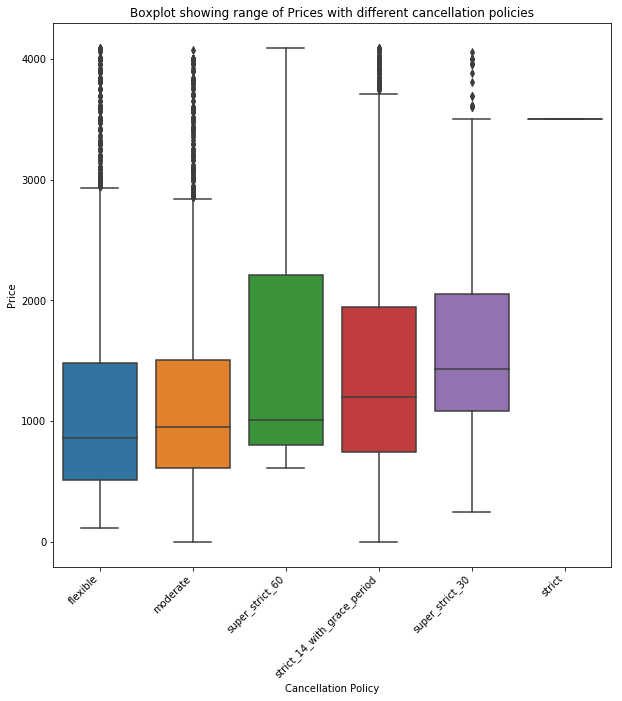

In [19]:
plt.figure(figsize=(10,10))
sort_price = listings_iqr.groupby('cancellation_policy')['price']\
                    .median()\
                    .sort_values(ascending=True)\
                    .index
sns.boxplot(y='price', x='cancellation_policy', data=listings_iqr, 
            order=sort_price)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.title(f'Boxplot showing range of Prices with different cancellation policies')
plt.xlabel('Cancellation Policy')
plt.ylabel('Price')
plt.show()

Being flexible comes in at first place by being the cheapest out the lot , the low entry point means they can be well suited to your needs and your indecision.  The stricter we get the more expensive the cancellation fee this could be due to them turning  away customers after you had booked and you cancelling may be money down the drain and try to recoup that money .

In [20]:
locations = listings_iqr[['latitude', 'longitude']]
locationlist = locations.values.tolist()

In [21]:
def colors(room_type):
    color = ''
    if room_type == 'Entire home/apt':
        color = 'blue'
    elif room_type == 'Private room':
        color = 'purple'
    elif room_type == 'Hotel room':
        color = 'green'
    else:
        color = 'red'
    return color

listings_iqr['color'] = listings_iqr['room_type'].apply(colors)

In [22]:
from folium.plugins import MarkerCluster
map3 = folium.Map(location=[-33.924870,18.424055], tiles='CartoDB positron', zoom_start=11)

marker_cluster = MarkerCluster().add_to(map3)
for point in range(0, len(locationlist)):
    if point in listings_iqr.index:
        folium.Marker(locationlist[point] , icon=folium.Icon(color=listings_iqr['color'][point])).add_to(marker_cluster)

In [23]:
legend_html = '''
     <div style="position: fixed; 
     bottom: 50px; left: 50px; width: 150px; height: 150px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     ">&nbsp; Legend <br>
     &nbsp; Entire home/apt &nbsp; <i class="fa fa-map-marker fa-2x"
                  style="color:#1569C7"></i><br>
    &nbsp; Private room &nbsp; <i class="fa fa-map-marker fa-2x"
                  style="color:purple"></i><br>
    &nbsp; Hotel room &nbsp; <i class="fa fa-map-marker fa-2x"
                  style="color:green"></i><br>
     &nbsp; Shared Room &nbsp; <i class="fa fa-map-marker fa-2x"
                  style="color:red"></i>
      </div>
     '''
map3.get_root().html.add_child(folium.Element(legend_html))
map3

In [24]:
map3.save('map.html')

Here we can a visual represantion of the differnt room types in accordance to the geolocation. We can also see how close each home is towards the beach or not . Or the proximity of each listing is towarsd other . Used grouping to  see certain cluster to se high frequency areas . 

# Reviews

In [25]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,3191,4888238,2013-05-31,5737473,Kathleen,Great home away from home! Bridgette and Marth...
1,3191,9128602,2013-12-09,8170322,Anita,Das Cottage liegt ruhig und sicher. Wir haben...
2,3191,9924130,2014-01-20,4039279,Zacki,This cottage was a great base from which to ex...
3,3191,16659537,2014-07-31,9729939,Doug,I had a great stay. All my needs were well ex...
4,3191,23247470,2014-11-26,9681619,Christopher,Excellent host. She provided everything we cou...


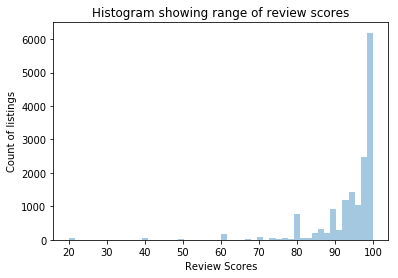

In [26]:
sns.distplot(listings_iqr.review_scores_rating.dropna(),kde=False)
plt.title(f'Histogram showing range of review scores')
plt.xlabel('Review Scores')
plt.ylabel('Count of listings')
plt.show()

Our histogram is skewed towards the right meaning positive reviews far outweigh the negative by far. Meaning the listings here have great reviews and consumers are enjoying their stay.

# Predicting

In [27]:
columns = ['accommodates', 'room_type', 'bedrooms',
          'bathrooms', 'beds', 'price', 'cleaning_fee', 'security_deposit', 'minimum_nights',
          'maximum_nights', 'number_of_reviews','weekly_price',
'monthly_price']

listings_iqr = listings_iqr[columns]
listings_iqr.corr()

,accommodates,bedrooms,bathrooms,beds,price,cleaning_fee,security_deposit,minimum_nights,maximum_nights,number_of_reviews,weekly_price,monthly_price
accommodates,1.000000,0.742468,0.596890,0.730711,0.535133,0.254620,0.152849,0.033305,0.035429,-0.055554,0.151911,0.183390
bedrooms,0.742468,1.000000,0.758092,0.780326,0.455024,0.254175,0.159957,0.042990,0.023424,-0.086236,0.152151,0.180978
bathrooms,0.596890,0.758092,1.000000,0.663903,0.418613,0.230294,0.155809,0.036994,0.023924,-0.059139,0.138644,0.167908
beds,0.730711,0.780326,0.663903,1.000000,0.375227,0.195479,0.103317,0.028206,0.014555,-0.068345,0.168836,0.198893
price,0.535133,0.455024,0.418613,0.375227,1.000000,0.282398,0.210165,0.017590,0.001458,-0.080147,0.260259,0.305732
cleaning_fee,0.254620,0.254175,0.230294,0.195479,0.282398,1.000000,0.268043,0.067291,-0.008551,0.087071,0.393517,0.419015
security_deposit,0.152849,0.159957,0.155809,0.103317,0.210165,0.268043,1.000000,0.188762,-0.004417,0.010518,0.152993,0.150440
minimum_nights,0.033305,0.042990,0.036994,0.028206,0.017590,0.067291,0.188762,1.000000,-0.001528,-0.028388,0.006793,-0.015248
maximum_nights,0.035429,0.023424,0.023924,0.014555,0.001458,-0.008551,-0.004417,-0.001528,1.000000,-0.002267,-0.056737,-0.039130
number_of_reviews,-0.055554,-0.086236,-0.059139,-0.068345,-0.080147,0.087071,0.010518,-0.028388,-0.002267,1.000000,0.001372,-0.001179


In [28]:
listings_iqr['bedrooms'] = listings_iqr['bedrooms'].replace(np.nan, 0)

- Create features for (dummies): bedrooms, accomodates,beds, room type
- sns.heatmap for price include nonsensical variables like :latitude, longitude, number of reviews,

Here we want to see how things correlate . But this is way to much as we want to see the correlation of the other features/columns in relation to price so we only focus on the Price column and use a heatmap to see it clearly.

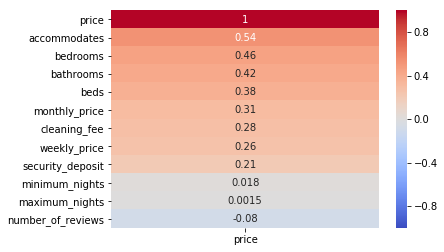

In [29]:
sns.heatmap(listings_iqr.corr()[['price']].sort_values(by=['price'],ascending=False),vmin=-1,
            cmap='coolwarm',
            annot=True)
plt.show()

In [30]:
dummied_listings = pd.get_dummies(listings_iqr, columns=['bedrooms', 'accommodates','beds', 'room_type'],drop_first=True)

In [ ]:
WE create dummies to see the relationship of the 

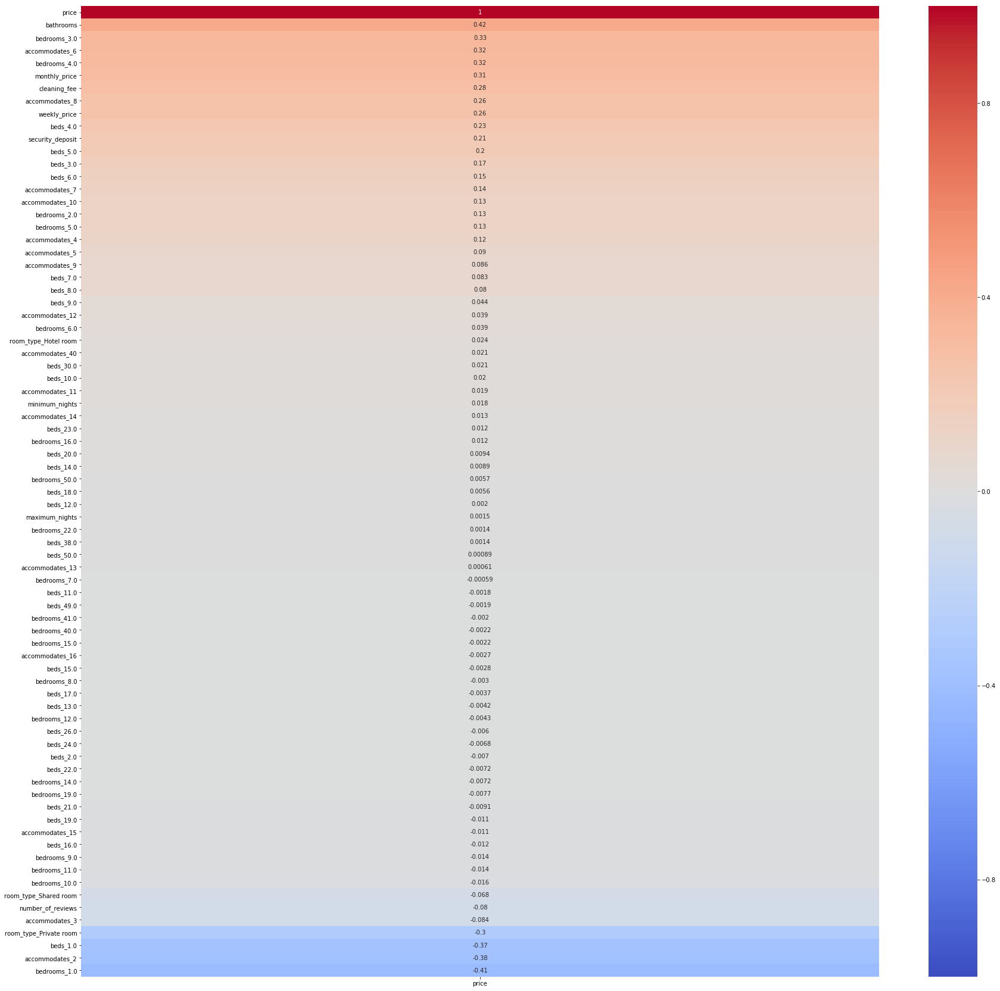

In [31]:
plt.figure(figsize=(30,30))
sns.heatmap(dummied_listings.corr()[['price']].sort_values(by=['price'],ascending=False),vmin=-1,
            cmap='coolwarm',
            annot=True)
plt.show()

In [36]:
dummied_listings = dummied_listings.dropna()

In [37]:
dummied_listings

,bathrooms,price,cleaning_fee,security_deposit,minimum_nights,maximum_nights,number_of_reviews,weekly_price,monthly_price,bedrooms_1.0,...,beds_23.0,beds_24.0,beds_26.0,beds_30.0,beds_38.0,beds_49.0,beds_50.0,room_type_Hotel room,room_type_Private room,room_type_Shared room
1,3.0,2036.0,850.0,2500.0,2,120,27,9000.0,40000.0,0,...,0,0,0,0,0,0,0,0,0,0
13,1.0,1294.0,600.0,2000.0,7,730,132,8400.0,19000.0,0,...,0,0,0,0,0,0,0,0,0,0
33,1.0,933.0,190.0,1903.0,1,1111,0,7613.0,16178.0,1,...,0,0,0,0,0,0,0,0,1,0
34,1.0,971.0,952.0,19032.0,14,1125,259,11419.0,38063.0,0,...,0,0,0,0,0,0,0,0,0,0
39,2.5,952.0,300.0,0.0,5,120,140,7800.0,23000.0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5738,2.0,1123.0,350.0,0.0,2,1125,52,3034.0,10110.0,0,...,0,0,0,0,0,0,0,0,0,0
5812,1.0,438.0,350.0,2501.0,1,1125,13,1650.0,6000.0,1,...,0,0,0,0,0,0,0,0,0,0
8570,1.5,1408.0,200.0,1500.0,3,1125,17,7500.0,25000.0,0,...,0,0,0,0,0,0,0,0,0,0
13031,1.0,552.0,180.0,0.0,1,183,74,2927.0,8912.0,1,...,0,0,0,0,0,0,0,0,0,0


In [38]:
x = dummied_listings.drop('price',axis=1)
y = dummied_listings['price']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state = 10)

In [40]:
regression = LinearRegression().fit(x_train, y_train)

In [41]:
print('R2: ', regression.score(x_train,y_train))

R2:  0.5877079007470605


In [43]:
print('TEST RMSE:', np.sqrt(sklearn.metrics.mean_squared_error(y_test, regression.predict(x_test))))
print('TRAINING RMSE:', np.sqrt(sklearn.metrics.mean_squared_error(y_train, regression.predict(x_train))))

TEST RMSE: 581.6981045607262
TRAINING RMSE: 499.7376627053776


In [45]:
from sklearn.linear_model import Ridge
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import ResidualsPlot

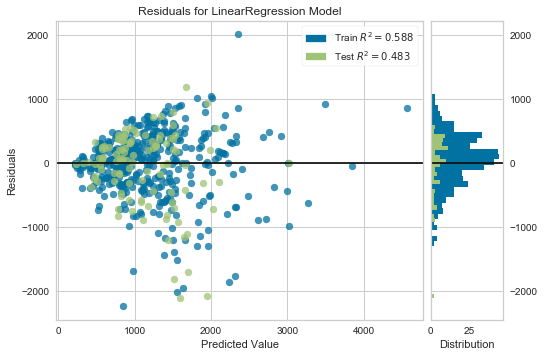

In [46]:
visualizer = ResidualsPlot(regression)
visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show()